# Different Target Transofrmations

looking at the final data, it became clear that the target must be transformed for more accurate predictions. This notebook will show prelminary modeling for different powers of my target variable to highlight the selection process behind my choice.

In [2]:
import numpy as np
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, Ridge, RidgeCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
import seaborn as sns
sns.set()
import pandas as pd
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import statsmodels.api as sm
import statsmodels.formula.api as smf
import scipy.stats as stats
from scipy.stats import boxcox

from sklearn.pipeline import Pipeline
%matplotlib inline
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [190]:
import scipy.stats as stats
from scipy.stats import boxcox

In [14]:
def diagnostic_plot(X, y):
    plt.figure(figsize=(20,5))
    
    rgr = LinearRegression()
    rgr.fit(X,y)
    pred = rgr.predict(X)
    
    plt.subplot(1, 2, 1)
    res = y - pred
    plt.scatter(pred, res)
    plt.title("Residual plot")
    plt.xlabel("prediction")
    plt.ylabel("residuals")
    
    plt.subplot(1, 2, 2)
    #Generates a probability plot of sample data against the quantiles of a 
    # specified theoretical distribution 
    stats.probplot(res, dist="norm", plot=plt)
    plt.title("Normal Q-Q plot")

In [109]:
df = pd.read_csv('data/nicedf.csv')

In [110]:
df.head(3)

,title,owners,num_reviews,positive,negative,ratio,pos_percent,neg_percent,ccu,median_2weeks,...,Electronic Arts,Paradox Interactive,SEGA,Sokpop Collective,Square Enix,THQ Nordic,Ubisoft,Winged Cloud,other,tinyBuild
0,OUTRIDERS,1811000.0,41862,26922,14940,1.802008,64.311309,35.688691,23037,279,...,0,0,0,0,1,0,0,0,0,0
1,It Takes Two,776000.0,21082,20205,877,23.038769,95.840053,4.159947,11513,425,...,1,0,0,0,0,0,0,0,0,0
2,Valheim,15510000.0,231017,222551,8466,26.287621,96.335335,3.664665,64931,435,...,0,0,0,0,0,0,0,0,1,0


In [111]:
df['age'] = 2021 - df.year_released

In [112]:
cols = list(df.columns)
cols.insert(14, cols.pop(cols.index('age')))

In [113]:
df=df[cols]

In [114]:
df.head(1)

,title,owners,num_reviews,positive,negative,ratio,pos_percent,neg_percent,ccu,median_2weeks,...,Electronic Arts,Paradox Interactive,SEGA,Sokpop Collective,Square Enix,THQ Nordic,Ubisoft,Winged Cloud,other,tinyBuild
0,OUTRIDERS,1811000.0,41862,26922,14940,1.802008,64.311309,35.688691,23037,279,...,0,0,0,0,1,0,0,0,0,0


In [138]:
df.columns

Index(['title', 'owners', 'num_reviews', 'positive', 'negative', 'ratio',
       'pos_percent', 'neg_percent', 'ccu', 'median_2weeks', 'median_forever',
       'average_2weeks', 'average_forever', 'been_sale', 'age', 'orig_price',
       'num_tags', 'num_genres', 'rating_val', 'num_followers',
       'num_languages', 'has_meta', 'userscore', 'Singleplayer_tag',
       'Indie_tag', 'Action_tag', 'Adventure_tag', 'Casual_tag',
       'Strategy_tag', 'Multiplayer_tag', 'RPG_tag', 'Simulation_tag',
       'Atmospheric_tag', 'Horror_tag', '2D_tag', 'Soundtrack_tag',
       'Great_tag', 'Story_tag', 'Rich_tag', 'World_tag', 'Shooter_tag',
       'Puzzle_tag', 'TurnBased_tag', 'Open_tag', 'FirstPerson_tag',
       'Survival_tag', 'Fantasy_tag', 'Funny_tag', 'Coop_tag',
       'Platformer_tag', 'Early_tag', 'Access_tag', 'Sim_tag', 'Indie_genre',
       'Action_genre', 'Adventure_genre', 'Casual_genre', 'Simulation_genre',
       'Strategy_genre', 'RPG_genre', '_genre', 'Early_genre', 'Access_

In [119]:
df.drop(columns=['year_released'], inplace=True)

In [ ]:
# simply adding an age column GREATLY increased r2, errors still high. 


# Baseline Model with all features

In [139]:
X, y = df.iloc[:,2:], df.iloc[:,1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)

X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=7)

In [140]:
lr = LinearRegression()

lr.fit(X_train, y_train)
lr.score(X_train, y_train)

0.7647879867788283

In [141]:
lr.score(X_val, y_val)

0.6382686287832295

Text(0.5, 1.0, 'Simple Regression')

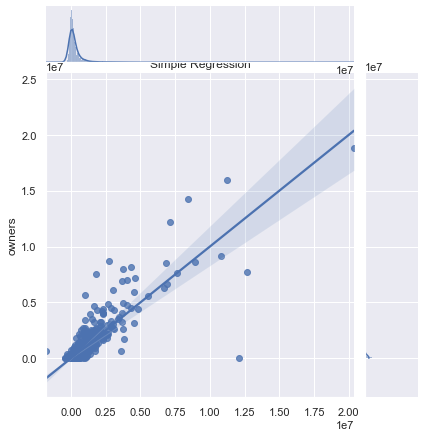

In [142]:
train_preds = lr.predict(X_train)


sns.jointplot(x = train_preds, y = y_train, kind='reg')
plt.title('Simple Regression')

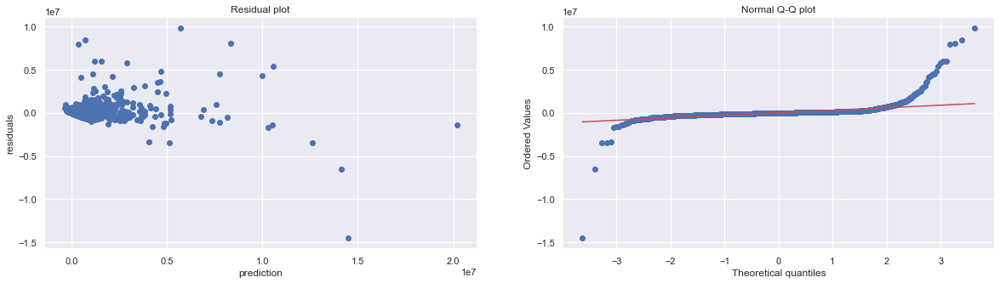

In [143]:
diagnostic_plot(X,y)

<AxesSubplot:>

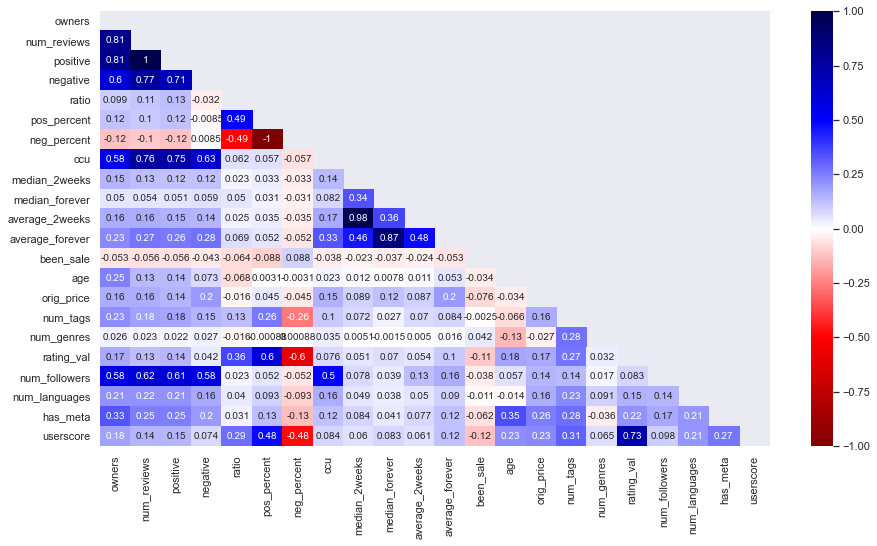

In [128]:
heatmapdf = df.iloc[:,1:23]
plt.figure(figsize(15,8))
upper = np.triu(heatmapdf.corr())
sns.heatmap(heatmapdf.corr(), cmap="seismic_r", annot=True, vmin=-1, vmax=1, mask=upper)



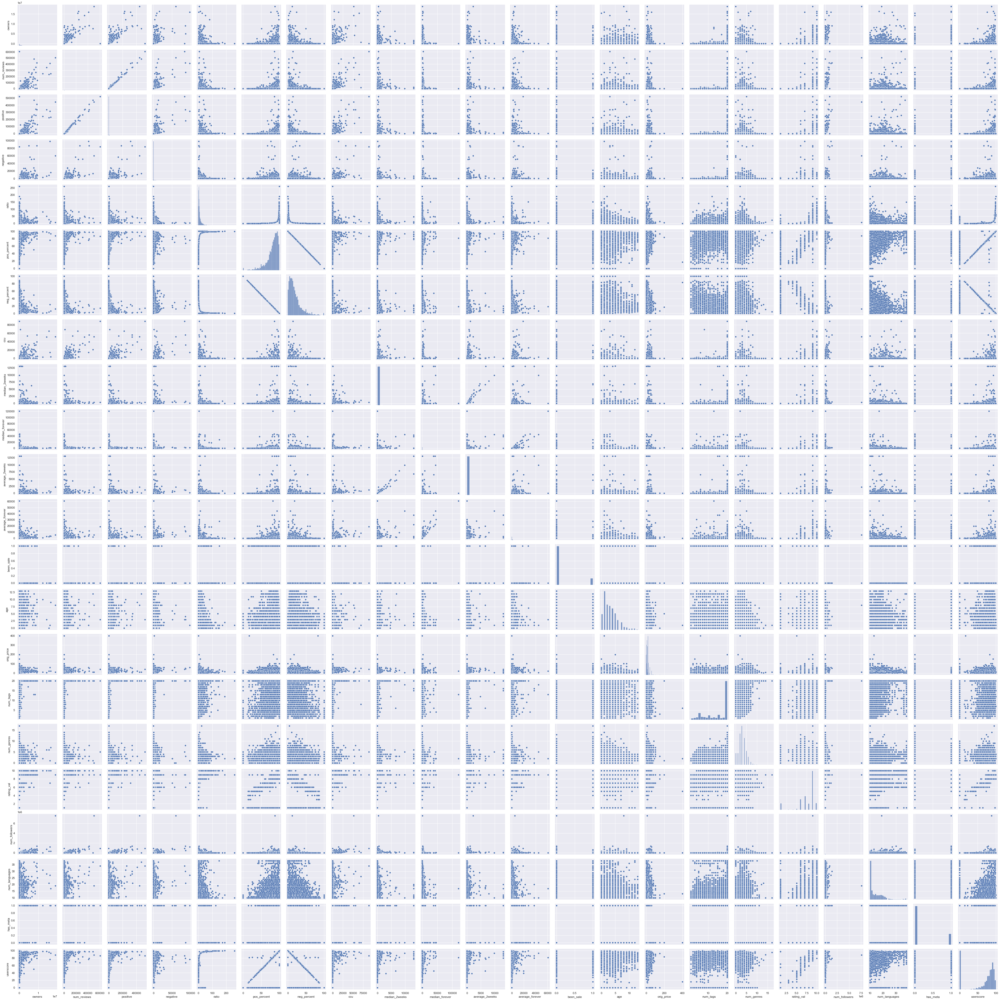

In [129]:
sns.pairplot(heatmapdf)

In [144]:
rmse = mean_squared_error(y_train, train_preds, squared=False)
print(rmse)
mae = mean_absolute_error(y_train, train_preds)
print(mae)

466887.8440713386
177086.08816249578


# Log Transformation
applying a log transformation to the target.

This seems so far to be the best model, as the mae is <1. The residulals, however, still do not seem to be normally distributed. Looking at the pairplot, this model can be improved by also taking the log of the reviews, which makes sense. As the number of reviews increase, there is diminishing returns on number of owners.

In [149]:
logdf = df.copy()

In [151]:
logdf.owners = np.log(logdf.owners)

In [152]:
X, y = logdf.iloc[:,2:], logdf.iloc[:,1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)

X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=7)

In [153]:
lr.fit(X_train, y_train)
lr.score(X_train, y_train)

0.6872437004322834

In [154]:
lr.score(X_val, y_val)

0.6734511859199653

Text(0.5, 1.0, 'Log Transformed')

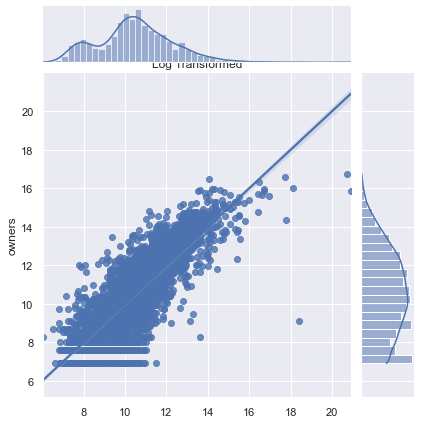

In [155]:
train_preds = lr.predict(X_train)

sns.jointplot(x = train_preds, y = y_train, kind='reg')
plt.title('Log Transformed')

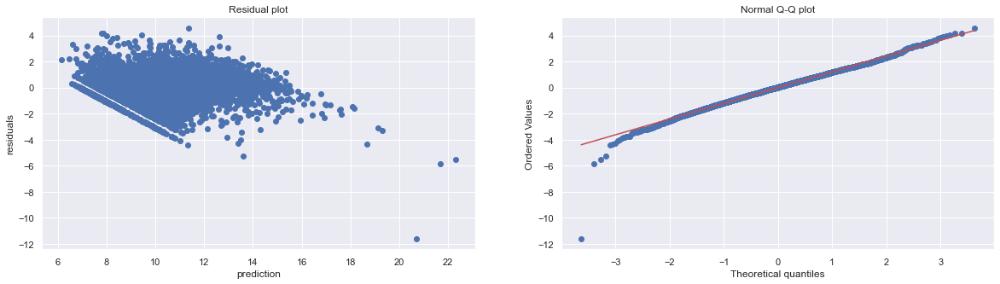

In [156]:
diagnostic_plot(X, y)

In [157]:
rmse = mean_squared_error(y_train, train_preds, squared=False)
print(rmse)
mae = mean_absolute_error(y_train, train_preds)
print(mae)

1.2131090745631226
0.9457947553103819


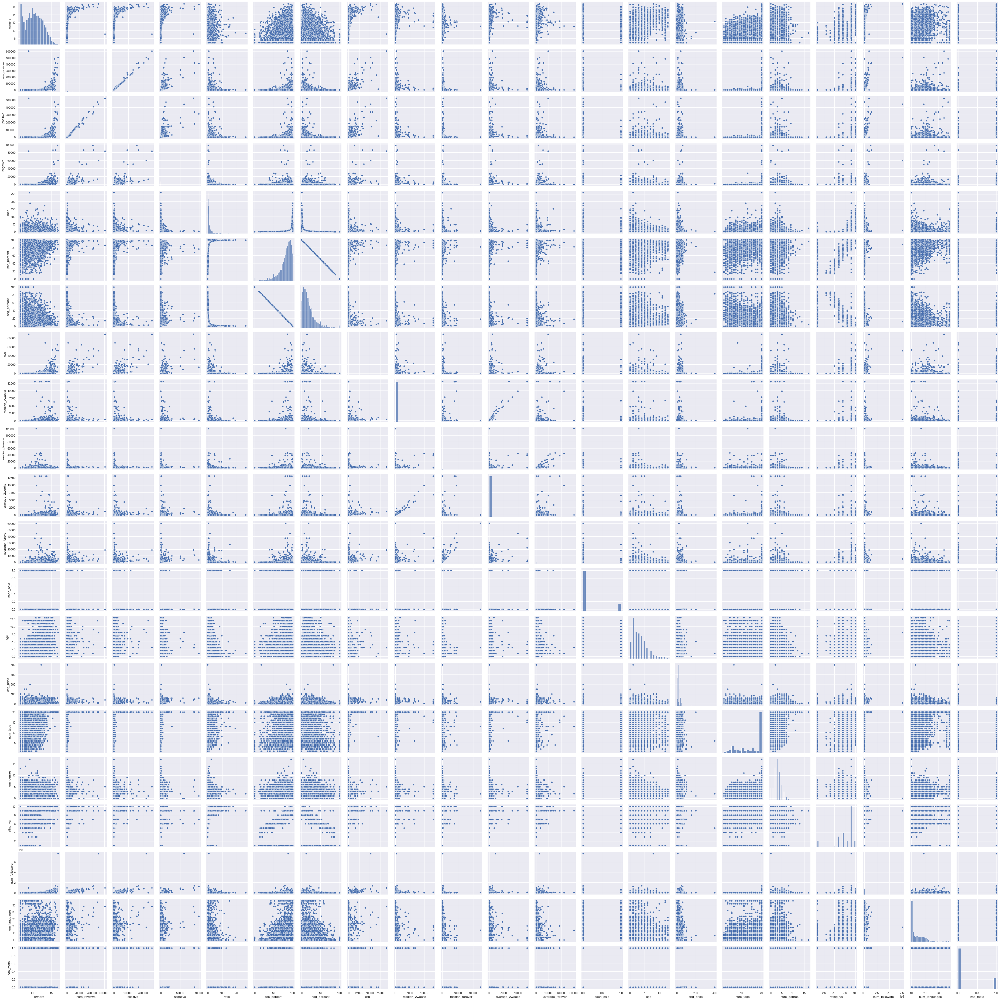

In [158]:
heatmapdf = logdf.iloc[:,1:22]
sns.pairplot(heatmapdf)

# Square Root transformation

While the predicted/actuals plot looks nicer, the mae and rmse are higher for this transformation than the log transformation.

In [159]:
rootdf = df.copy()

In [160]:
rootdf.owners = sqrt(rootdf.owners)

In [169]:
X, y = rootdf.iloc[:,2:], rootdf.iloc[:,1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)

X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=7)

In [170]:
lr.fit(X_train, y_train)
lr.score(X_train, y_train)

0.7414401155285639

In [171]:
lr.score(X_val, y_val)

0.7084910450046504

Text(0.5, 1.0, 'Root Transformed')

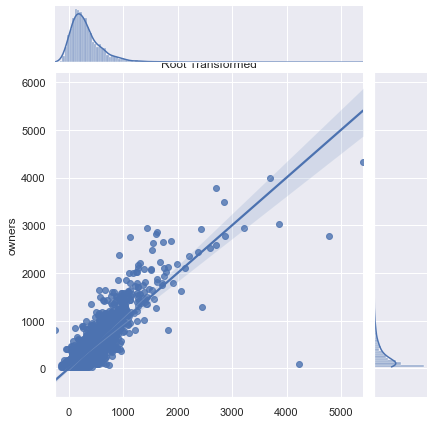

In [172]:
train_preds = lr.predict(X_train)

sns.jointplot(x = train_preds, y = y_train, kind='reg')
plt.title('Root Transformed')

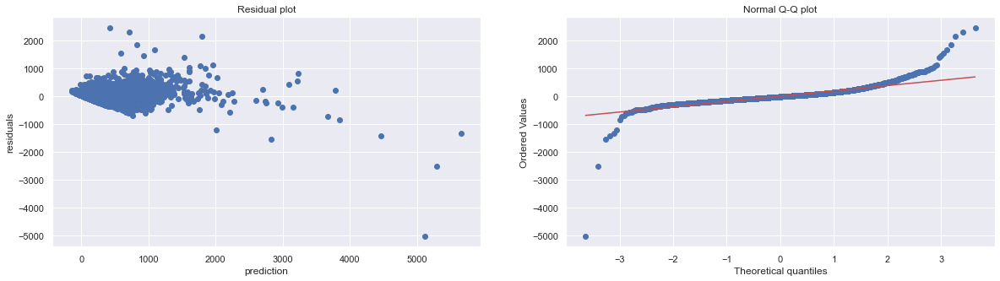

In [173]:
diagnostic_plot(X, y)

In [174]:
rmse = mean_squared_error(y_train, train_preds, squared=False)
print(rmse)
mae = mean_absolute_error(y_train, train_preds)
print(mae)

216.52755416065492
136.742007515788


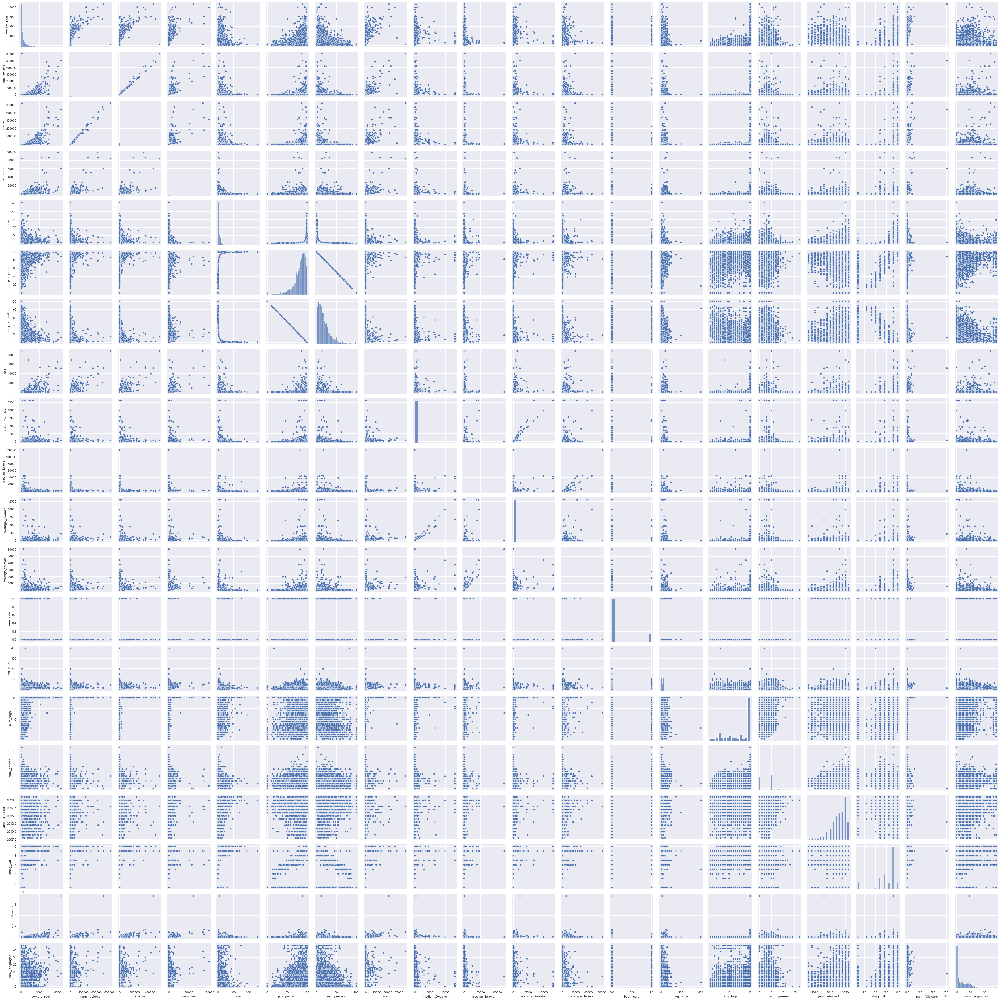

In [57]:
heatmapdf = rootdf.iloc[:,1:21]
sns.pairplot(heatmapdf)

# Reciporocal Transformation

Definitely not the correct transformation

In [167]:
recipdf = df.copy()

In [168]:
recipdf.owners = 1/recipdf.owners

In [175]:
X, y = recipdf.iloc[:,2:], recipdf.iloc[:,1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)

X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=7)

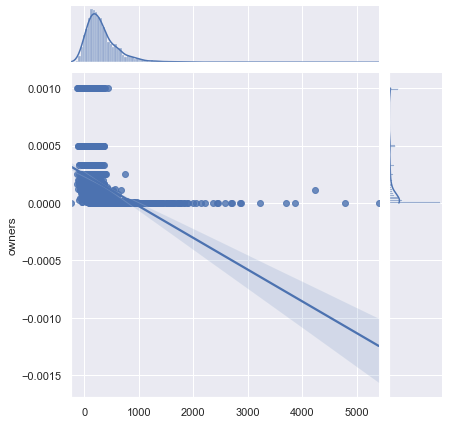

In [177]:
train_preds = lr.predict(X_train)

sns.jointplot(x = train_preds, y = y_train, kind='reg')


# Box-Cox Transformation

In [188]:
boxdf = df.copy()

In [204]:
#boxdf.owners = stats.boxcox(boxdf.owners)

fitted_data, fitted_lambda = stats.boxcox(boxdf.owners)

In [207]:
fitted_lambda

-0.03313328888980232

In [209]:
boxdf.owners, lmbda = boxcox(boxdf.owners, lmbda=None)

In [210]:
boxdf.head(1)

,title,owners,num_reviews,positive,negative,ratio,pos_percent,neg_percent,ccu,median_2weeks,...,Electronic Arts,Paradox Interactive,SEGA,Sokpop Collective,Square Enix,THQ Nordic,Ubisoft,Winged Cloud,other,tinyBuild
0,OUTRIDERS,11.457498,41862,26922,14940,1.802008,64.311309,35.688691,23037,279,...,0,0,0,0,1,0,0,0,0,0


In [212]:
X, y = boxdf.iloc[:,2:], boxdf.iloc[:,1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .2, random_state = 7)

X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size = .25, random_state=7)



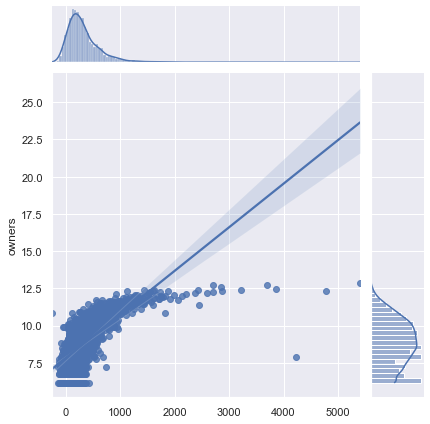

In [214]:
train_preds = lr.predict(X_train)

sns.jointplot(x = train_preds, y=y_train, kind='reg')

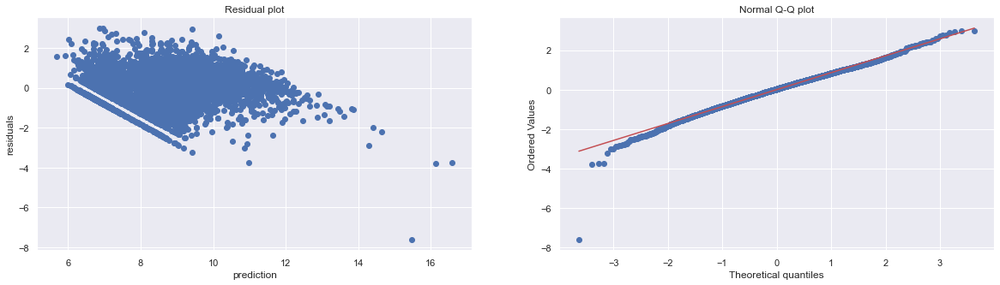

In [215]:
diagnostic_plot(X,y)

In [216]:
rmse = mean_squared_error(y_train, train_preds, squared=False)
print(rmse)
mae = mean_absolute_error(y_train, train_preds)
print(mae)

493.7847094770489
337.8851506520816


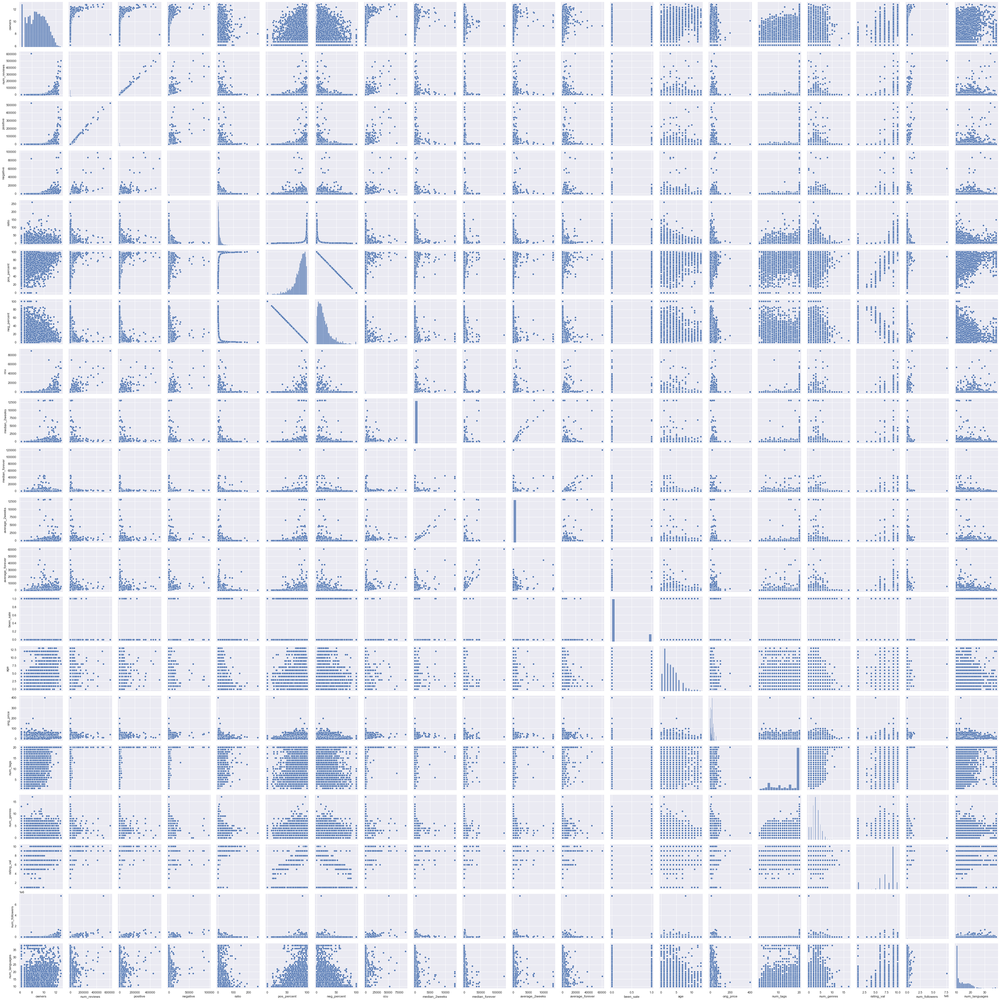

In [217]:
heatmapdf = boxdf.iloc[:,1:21]
sns.pairplot(heatmapdf)

In [219]:
logdf[logdf.negative == 0]

,title,owners,num_reviews,positive,negative,ratio,pos_percent,neg_percent,ccu,median_2weeks,...,Electronic Arts,Paradox Interactive,SEGA,Sokpop Collective,Square Enix,THQ Nordic,Ubisoft,Winged Cloud,other,tinyBuild
251,Sakura Forest Girls,7.600902,7,7,0,7.0,100.0,0.0,8,0,...,0,0,0,0,0,0,0,1,0,0
384,Sakura Succubus 4,8.294050,44,44,0,44.0,100.0,0.0,4,0,...,0,0,0,0,0,0,0,1,0,0
1067,Eidolon,10.985293,13,13,0,13.0,100.0,0.0,0,0,...,0,0,0,0,0,0,0,0,1,0
1177,Ginga Force,6.907755,34,34,0,34.0,100.0,0.0,0,0,...,0,0,0,0,0,0,0,0,1,0
1194,Natsuki Chronicles,7.600902,26,26,0,26.0,100.0,0.0,2,0,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4853,Bulldozer,8.853665,7,7,0,7.0,100.0,0.0,0,0,...,0,0,0,0,0,0,0,0,1,0
4861,The Long Sky,6.907755,3,3,0,3.0,100.0,0.0,0,0,...,0,0,0,0,0,0,0,0,1,0
4871,T. B. P.,9.392662,2,2,0,2.0,100.0,0.0,0,0,...,0,0,0,0,0,0,0,0,1,0
4892,REALITY,9.798127,9,9,0,9.0,100.0,0.0,0,0,...,0,0,0,0,0,0,0,0,1,0
